In [1]:
import os
import tempfile

import anndata
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import scvi
import seaborn as sns
import torch

Global seed set to 0


In [2]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Global seed set to 0


Last run with scvi-tools version: 0.17.1


In [3]:
import os
## Set up output path
output_p  = '/home/jupyter/tmpmount/vasculature/nuclei_cell_integ/same_organs_7k_hvgs/'
os.makedirs(output_p, exist_ok=True)

In [4]:
ref = sc.read_h5ad("/home/jupyter/gdrive/ec_re_integrated.h5ad")

In [5]:
ref

AnnData object with n_obs × n_vars = 34433 × 30021
    obs: 'orig.ident', 'Sample', 'Winkler_annotation_ec', 'Winkler_annotation_mural', 'Winkler_annotation_mural_fine', 'donor', 'kit', 'study', 'organ_uni', 'Winkler_annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Winkler_broad_annotation', 'id', 'organ', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'doublet_pv

In [6]:
np.unique(ref.obs.donor)

array(['A12', 'A13', 'A15', 'A21', 'A23', 'A24', 'A25', 'A26', 'A29',
       'A30', 'A32', 'A33', 'A34', 'A35', 'A37', 'A38', 'A40', 'A43',
       'A44', 'A45', 'A46', 'A47', 'A51', 'A56', 'A59', 'A6', 'A60',
       'A61', 'CTRL085', 'CTRL086', 'CTRL099_21', 'CTRL099_22', 'CTRL12',
       'E1', 'E2', 'E3', 'F19', 'F20', 'F25', 'F27', 'F36', 'F40', 'HD1',
       'HD2', 'HD3', 'RCC1', 'RCC2', 'RCC3', 'TSP1', 'TSP10', 'TSP12',
       'TSP14', 'TSP2', 'TSP4', 'TSP6', 'TSP7', 'TSP9', 'TxK1', 'TxK3',
       'TxK4', 'VHL_RCC', 'Wilms2'], dtype=object)

In [7]:
np.unique(ref.obs.study)

array(['TS', 'Winkler_et_al_2022', 'hca', 'liver'], dtype=object)

In [8]:
np.unique(ref.obs.kit)

array(['10X', '10x3prime_v2', '10x3prime_v3', '10x5prime', '10x5prime_v2',
       '10x_3prime'], dtype=object)

In [9]:
ref.obs['cells_or_nuclei'] = 'cells'

In [10]:
ref.obs['organ_source'] = ref.obs['organ_uni'].astype(str) + "_" + ref.obs['cells_or_nuclei'].astype(str)
ref.obs['organ_source']

ctrl12_ATTCCTACAGGGCTTC-0                                               brain_cells
ctrl12_TTCAGGAGTTGGGTTT-0                                               brain_cells
ctrl12_CTAGACAGTTGCTAGT-0                                               brain_cells
ctrl12_GTTGTAGAGGTTCATC-0                                               brain_cells
ctrl12_GAAACCTCATCCCACT-0                                               brain_cells
                                                                          ...      
TGGTACAAGCACTCGC_TSP9_Pancreas_exocrine_10X_1_1_CellCountLive-35     pancreas_cells
AGGGAGTGTACGATTC_TSP9_Pancreas_exocrine_10X_1_1_CellCountLive-35     pancreas_cells
AACCAACGTTCTCCCA_TSP9_Pancreas_exocrine_10X_1_1_CellCountTotal-35    pancreas_cells
CAAAGAAAGCGGTATG_TSP9_Pancreas_exocrine_10X_1_1_CellCountLive-35     pancreas_cells
ACTACGACAGCGATTT_TSP9_Pancreas_exocrine_10X_1_1_CellCountTotal-35    pancreas_cells
Name: organ_source, Length: 34433, dtype: object

In [11]:
ref.obs['batch_scarches'] = ref.obs.donor.astype(str) + "_" + ref.obs.study.astype(str) + "_" + ref.obs.kit.astype(str) 

In [12]:
ref.obs['batch_scarches']

ctrl12_ATTCCTACAGGGCTTC-0                                            CTRL12_Winkler_et_al_2022_10x3prime_v3
ctrl12_TTCAGGAGTTGGGTTT-0                                            CTRL12_Winkler_et_al_2022_10x3prime_v3
ctrl12_CTAGACAGTTGCTAGT-0                                            CTRL12_Winkler_et_al_2022_10x3prime_v3
ctrl12_GTTGTAGAGGTTCATC-0                                            CTRL12_Winkler_et_al_2022_10x3prime_v3
ctrl12_GAAACCTCATCCCACT-0                                            CTRL12_Winkler_et_al_2022_10x3prime_v3
                                                                                      ...                  
TGGTACAAGCACTCGC_TSP9_Pancreas_exocrine_10X_1_1_CellCountLive-35                                TSP9_TS_10X
AGGGAGTGTACGATTC_TSP9_Pancreas_exocrine_10X_1_1_CellCountLive-35                                TSP9_TS_10X
AACCAACGTTCTCCCA_TSP9_Pancreas_exocrine_10X_1_1_CellCountTotal-35                               TSP9_TS_10X
CAAAGAAAGCGGTATG_TSP9_Pancre

In [13]:
np.unique(ref.obs['organ_uni'])

array(['adipose_tissue', 'bladder', 'brain', 'decidua', 'heart', 'kidney',
       'large_intestine', 'large_vessels', 'liver', 'lung', 'lymph_node',
       'muscle', 'oesophagus', 'pancreas', 'small_intestine', 'spleen',
       'thymus', 'trachea', 'uterus'], dtype=object)

In [14]:
ref = ref[ref.obs['organ_uni'].isin(['muscle', 'kidney', 'heart', 'liver', 'brain', 'lung', 'pancreas', 'muscle'])]
ref

View of AnnData object with n_obs × n_vars = 22615 × 30021
    obs: 'orig.ident', 'Sample', 'Winkler_annotation_ec', 'Winkler_annotation_mural', 'Winkler_annotation_mural_fine', 'donor', 'kit', 'study', 'organ_uni', 'Winkler_annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Winkler_broad_annotation', 'id', 'organ', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'do

In [15]:
query = sc.read_h5ad("/home/jupyter/gdrive/vasc_nuclei_scvi_without_doublets.h5ad")
query

AnnData object with n_obs × n_vars = 67130 × 14675
    obs: 'subject', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'library_id', 'batch', 'brain_region', 'age_death', 'msex', 'pmi', 'ADdiag2types', 'percent.mt', 'percent.rp', 'celltype', 'cellsubtype', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'organ', 'cell_or_nuclei', 'ID', 'Study', 'PoolDon', 'DonorPool', 'scDonor_snBatch', 'lung_cell_states', 'cell_state', 'lung_region', 'sample', 'sex', 'suspension_type', 'SampleID', 'PatientID', 'snRNAPreparation', 'RNA_snn_res.0.5', 'seurat_clusters', 'oricluster', 'newcluster', 'Dataset', 'development_stage', 'pancreas_cell_states', 'cell_type', 'skeletal_muscle_cell_states', 'suspension_uuid', 'liver_cell_states', 'liver_region', 'age_group', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'scrublet_score', 'heart_cell_states', 'heart_region', 'Cell', 'Treat', 'Sample', 'Region', 'nCount_SC

In [16]:
query.var

,highly_variable,highly_variable_rank,means,variances,variances_norm
SAMD11,False,NaN,0.009668,0.011809,0.938548
NOC2L,False,NaN,0.047460,0.052865,0.731827
KLHL17,False,NaN,0.010293,0.010754,0.798716
HES4,True,2356.0,0.327514,1.068231,1.224255
ISG15,True,1855.0,0.060226,0.128968,1.373680
...,...,...,...,...,...
MT-ND4L,True,331.0,0.150827,1.211159,4.006039
MT-ND4,True,120.0,1.087249,65.557538,8.544523
MT-ND5,True,273.0,0.295650,3.571321,4.737541
MT-ND6,True,819.0,0.052078,0.179176,2.236278


In [17]:
np.unique(query.obs.donor)

array(['18-142', '18-162', '18-312', '3499', '3504', '3535', '3593',
       '3613', 'A26', 'A37', 'A40', 'A41', 'A42', 'A47', 'A48', 'AFES365',
       'AFES448', 'C1', 'C2', 'C3', 'C4', 'C41', 'C5', 'C58', 'C7', 'C70',
       'C72', 'C8', 'C9', 'D1', 'D11', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7',
       'E181', 'E212', 'E213', 'E219', 'E232', 'E268', 'E290', 'E311',
       'E337', 'E361', 'E371', 'E372', 'E379', 'E381', 'H2', 'H3', 'H4',
       'H5', 'H6', 'H7', 'HM1', 'HM10', 'HM11', 'HM12', 'HM13', 'HM15',
       'HM2', 'HM21', 'HM22', 'HM23', 'HM3', 'HM4', 'HM5', 'HM6', 'HM7',
       'HM8', 'HM9', 'KRP446', 'KRP460', 'KRP461', 'KRP462', 'L425_23',
       'L425_25', 'L425_33', 'ROSMAP-10643', 'ROSMAP-12311',
       'ROSMAP-12562', 'ROSMAP-13327', 'ROSMAP-13381', 'ROSMAP-13759',
       'ROSMAP-13862', 'ROSMAP-14312', 'ROSMAP-14332', 'ROSMAP-14748',
       'ROSMAP-14875', 'ROSMAP-15253', 'ROSMAP-16518', 'ROSMAP-17975',
       'ROSMAP-18100', 'ROSMAP-18228', 'ROSMAP-18410', 'ROSMAP-18612',


In [18]:
np.unique(query.obs.study)

array(['Garcia_et_al_2022', 'Lake et al. 2021', 'Litvinukova_et_al_2020',
       'MacParland_et_al_2018', 'Madissoon_et_al_2022',
       'Muto et al. 2021', 'Perez et al. 2022', 'Sun_et_al_2023',
       'Tosti et al. 2021', 'Yang_et_al_2022'], dtype=object)

In [19]:
np.unique(query.obs.kit)

array(["10x 3' v2", "10x 3' v3", "10x 5' v1"], dtype=object)

In [20]:
query.obs['batch_scarches'] = query.obs.donor.astype(str) + "_" + query.obs.study.astype(str) + "_" + query.obs.kit.astype(str) 

In [21]:
query.obs['batch_scarches']

CCTTACGTCTACTATC-1-HCAHeart7664653      D2_Litvinukova_et_al_2020_10x 3' v2
AGGCCGTCAGCGATCC-1-HCAHeart7829979      D4_Litvinukova_et_al_2020_10x 3' v2
CGACAGCAGTTGTCGT-1-H0037_LV             H4_Litvinukova_et_al_2020_10x 3' v3
ACGCCGAGTCCATCCT-1-HCAHeart7888928      D7_Litvinukova_et_al_2020_10x 3' v2
AACCCAAAGGACAGCT-1-H0025_RV             H3_Litvinukova_et_al_2020_10x 3' v3
                                                      ...                  
31719                                          C5_Yang_et_al_2022_10x 3' v3
Hippocampus.CTACAGAGTGGTATGG-38-1     ROSMAP-97816_Sun_et_al_2023_10x 3' v3
5652                                           C1_Yang_et_al_2022_10x 3' v3
32494                                          C5_Yang_et_al_2022_10x 3' v3
D20-125069.4207                            E268_Garcia_et_al_2022_10x 3' v3
Name: batch_scarches, Length: 67130, dtype: object

In [22]:
query.obs['cells_or_nuclei'] = 'nuclei'

In [23]:
query.obs['organ_source'] = query.obs['organ'].astype(str) + "_" + query.obs['cells_or_nuclei'].astype(str)
query.obs['organ_source']

CCTTACGTCTACTATC-1-HCAHeart7664653    Heart_nuclei
AGGCCGTCAGCGATCC-1-HCAHeart7829979    Heart_nuclei
CGACAGCAGTTGTCGT-1-H0037_LV           Heart_nuclei
ACGCCGAGTCCATCCT-1-HCAHeart7888928    Heart_nuclei
AACCCAAAGGACAGCT-1-H0025_RV           Heart_nuclei
                                          ...     
31719                                 brain_nuclei
Hippocampus.CTACAGAGTGGTATGG-38-1     brain_nuclei
5652                                  brain_nuclei
32494                                 brain_nuclei
D20-125069.4207                       brain_nuclei
Name: organ_source, Length: 67130, dtype: object

In [24]:
query

AnnData object with n_obs × n_vars = 67130 × 14675
    obs: 'subject', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'library_id', 'batch', 'brain_region', 'age_death', 'msex', 'pmi', 'ADdiag2types', 'percent.mt', 'percent.rp', 'celltype', 'cellsubtype', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'organ', 'cell_or_nuclei', 'ID', 'Study', 'PoolDon', 'DonorPool', 'scDonor_snBatch', 'lung_cell_states', 'cell_state', 'lung_region', 'sample', 'sex', 'suspension_type', 'SampleID', 'PatientID', 'snRNAPreparation', 'RNA_snn_res.0.5', 'seurat_clusters', 'oricluster', 'newcluster', 'Dataset', 'development_stage', 'pancreas_cell_states', 'cell_type', 'skeletal_muscle_cell_states', 'suspension_uuid', 'liver_cell_states', 'liver_region', 'age_group', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'scrublet_score', 'heart_cell_states', 'heart_region', 'Cell', 'Treat', 'Sample', 'Region', 'nCount_SC

/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


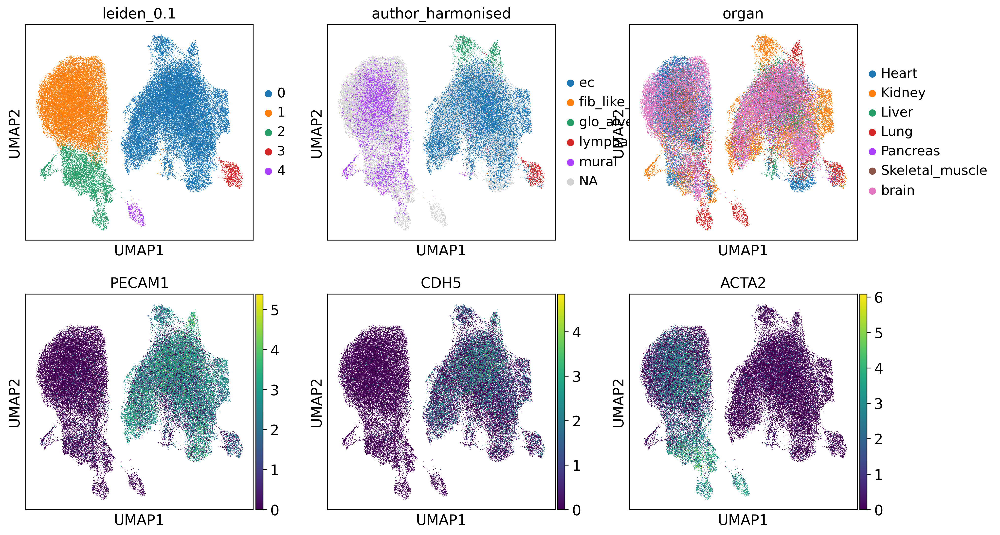

In [25]:
sc.set_figure_params(dpi = 150)
sc.pl.umap(query, color = ['leiden_0.1','author_harmonised', 'organ', 'PECAM1', 'CDH5', 'ACTA2'], ncols = 3)

In [26]:
query.obs['leiden_anno'] = query.obs['leiden_0.1']

In [27]:
query.obs['leiden_anno'] = query.obs['leiden_anno'].astype(str)

In [28]:
query.obs['leiden_anno']

CCTTACGTCTACTATC-1-HCAHeart7664653    0
AGGCCGTCAGCGATCC-1-HCAHeart7829979    1
CGACAGCAGTTGTCGT-1-H0037_LV           1
ACGCCGAGTCCATCCT-1-HCAHeart7888928    0
AACCCAAAGGACAGCT-1-H0025_RV           1
                                     ..
31719                                 0
Hippocampus.CTACAGAGTGGTATGG-38-1     0
5652                                  0
32494                                 0
D20-125069.4207                       0
Name: leiden_anno, Length: 67130, dtype: object

In [29]:
# Replace 'o' with 'ec' in the 'ann' column
query.obs['leiden_anno'] = query.obs['leiden_anno'].str.replace('0', 'Endothelial cells')
query.obs['leiden_anno'] = query.obs['leiden_anno'].str.replace('1', 'Mural cells')
query.obs['leiden_anno'] = query.obs['leiden_anno'].str.replace('2', 'Mural cells')
query.obs['leiden_anno'] = query.obs['leiden_anno'].str.replace('4', 'Mural cells')
query.obs['leiden_anno'] = query.obs['leiden_anno'].str.replace('3', 'LEC')

/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


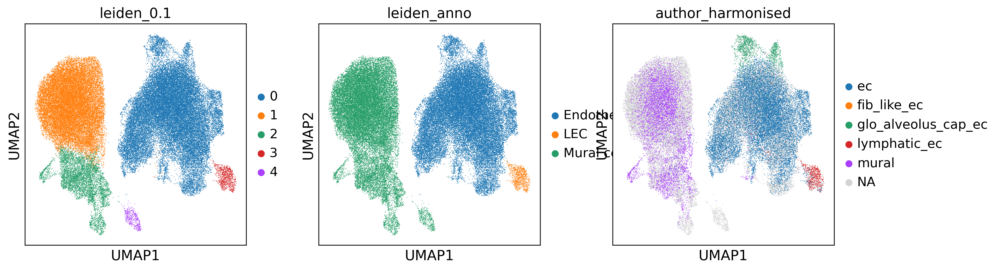

In [30]:
sc.pl.umap(query, color = ['leiden_0.1', 'leiden_anno', 'author_harmonised'])

In [31]:
query.obs['cells_or_nuclei']

CCTTACGTCTACTATC-1-HCAHeart7664653    nuclei
AGGCCGTCAGCGATCC-1-HCAHeart7829979    nuclei
CGACAGCAGTTGTCGT-1-H0037_LV           nuclei
ACGCCGAGTCCATCCT-1-HCAHeart7888928    nuclei
AACCCAAAGGACAGCT-1-H0025_RV           nuclei
                                       ...  
31719                                 nuclei
Hippocampus.CTACAGAGTGGTATGG-38-1     nuclei
5652                                  nuclei
32494                                 nuclei
D20-125069.4207                       nuclei
Name: cells_or_nuclei, Length: 67130, dtype: category
Categories (1, object): ['nuclei']

/opt/conda/envs/scvi/lib/python3.8/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/conda/envs/scvi/lib/python3.8/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/conda/envs/scvi/lib/python3.8/site-packages/anndata/_core/anndata.py:1230: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


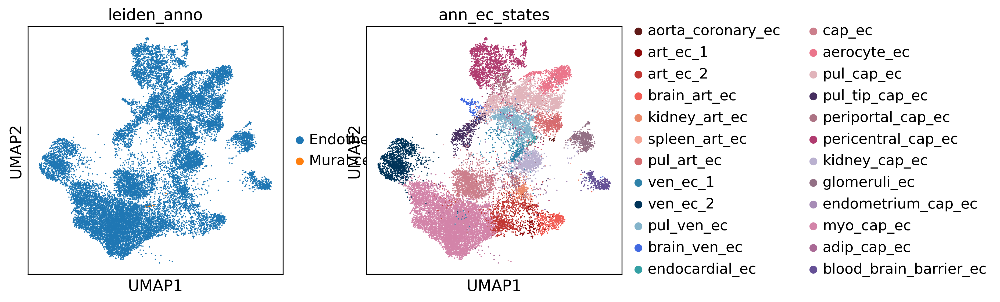

In [32]:
sc.pl.umap(ref, color = ['leiden_anno', 'ann_ec_states'])

In [33]:
ref = ref[ref.obs.leiden_anno.isin(['Endothelial cells'])]
ref

View of AnnData object with n_obs × n_vars = 22603 × 30021
    obs: 'orig.ident', 'Sample', 'Winkler_annotation_ec', 'Winkler_annotation_mural', 'Winkler_annotation_mural_fine', 'donor', 'kit', 'study', 'organ_uni', 'Winkler_annotation', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Winkler_broad_annotation', 'id', 'organ', 'sorting', 'location', 'age', 'gender', 'dissociation', 'scrublet_score', 'doublet_bh_pval', 'published_annotation', 'HCA', 'published_annotation_skin', 'batch', 'cell_ontology_class', 'free_annotation', 'compartment', 'age2', 'barcode', 'concat_sample_no', 'Population ', 'hospital_id', 'Organ', 'Cell_category', 'Predicted_labels_CellTypist', 'Majority_voting_CellTypist', 'Majority_voting_CellTypist_high', 'do

In [34]:
query = query[query.obs.leiden_anno.isin(['Endothelial cells'])]
query

View of AnnData object with n_obs × n_vars = 36055 × 14675
    obs: 'subject', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'id', 'library_id', 'batch', 'brain_region', 'age_death', 'msex', 'pmi', 'ADdiag2types', 'percent.mt', 'percent.rp', 'celltype', 'cellsubtype', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'organ', 'cell_or_nuclei', 'ID', 'Study', 'PoolDon', 'DonorPool', 'scDonor_snBatch', 'lung_cell_states', 'cell_state', 'lung_region', 'sample', 'sex', 'suspension_type', 'SampleID', 'PatientID', 'snRNAPreparation', 'RNA_snn_res.0.5', 'seurat_clusters', 'oricluster', 'newcluster', 'Dataset', 'development_stage', 'pancreas_cell_states', 'cell_type', 'skeletal_muscle_cell_states', 'suspension_uuid', 'liver_cell_states', 'liver_region', 'age_group', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'scrublet_score', 'heart_cell_states', 'heart_region', 'Cell', 'Treat', 'Sample', 'Region', 'n

In [35]:
full = anndata.concat([query, ref], join = 'inner')
full

AnnData object with n_obs × n_vars = 58658 × 14580
    obs: 'orig.ident', 'id', 'batch', 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'organ', 'n_genes', 'scrublet_score', 'Sample', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'

In [36]:
# Drop columns with any NaN values
full.obs = full.obs.dropna(axis=1)

In [37]:
full

AnnData object with n_obs × n_vars = 58658 × 14580
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'

In [38]:
full.write(output_p + 'ec_cell_nuc_before_scvi_240719.h5ad', compression= 'gzip')

### 1. HVG selection

In [39]:
## Load full dataset
adata_r = full

In [40]:
adata_r

AnnData object with n_obs × n_vars = 58658 × 14580
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'

In [41]:
## Exclude CC genes, MT-genes and CITE-seq entries, as well as VDJ genes
cc_genes = []
with open('/home/jupyter/tmpmount/vasculature/nuclei_cell_integ/human_cell_cycle_genes.txt', 'r') as f:
    for line in f:
        cc_genes.append(line.rstrip())

In [42]:
#remove ribosomal, mitochondrial and cell cycle genes
mito_genes = list(adata_r.var_names[adata_r.var_names.isin([name for name in adata_r.var_names if name.startswith('MT-')])])
RP_genes = list(adata_r.var_names[adata_r.var_names.isin([name for name in adata_r.var_names if name.startswith('RP')])])

adata_r=adata_r[:,~adata_r.var_names.isin(RP_genes)]
adata_r=adata_r[:,~adata_r.var_names.isin(mito_genes)]
adata_r=adata_r[:,~adata_r.var_names.isin(cc_genes)]

In [43]:
adata_r

View of AnnData object with n_obs × n_vars = 58658 × 13965
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'

In [44]:
## We are using the union of HVGs for cells and nuclei (has worked best compared to intersect or cells only)
adata_nucs_r = adata_r[adata_r.obs['cells_or_nuclei']=='nuclei']
adata_cells_r = adata_r[adata_r.obs['cells_or_nuclei']=='cells']

/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}


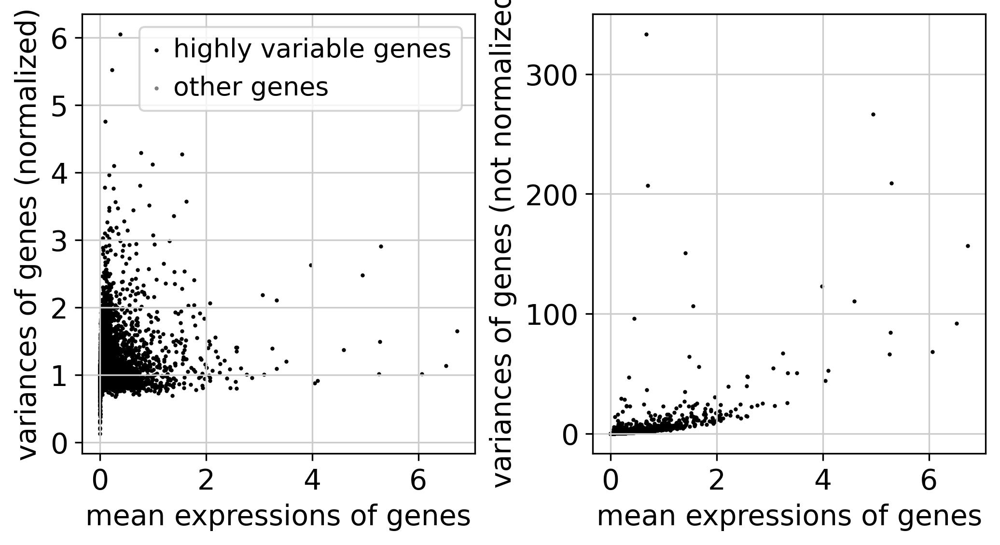

In [45]:
## Highly variable genes (per sample, then taking those appearing as HVGs in the most samples)
sc.pp.highly_variable_genes(
    adata_nucs_r,
    n_top_genes=7000,
    subset=True,
    layer="counts",
    flavor="seurat_v3",
    batch_key="study",
    span=1,
)

sc.pl.highly_variable_genes(adata_nucs_r)

/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:148: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['hvg'] = {'flavor': 'seurat_v3'}


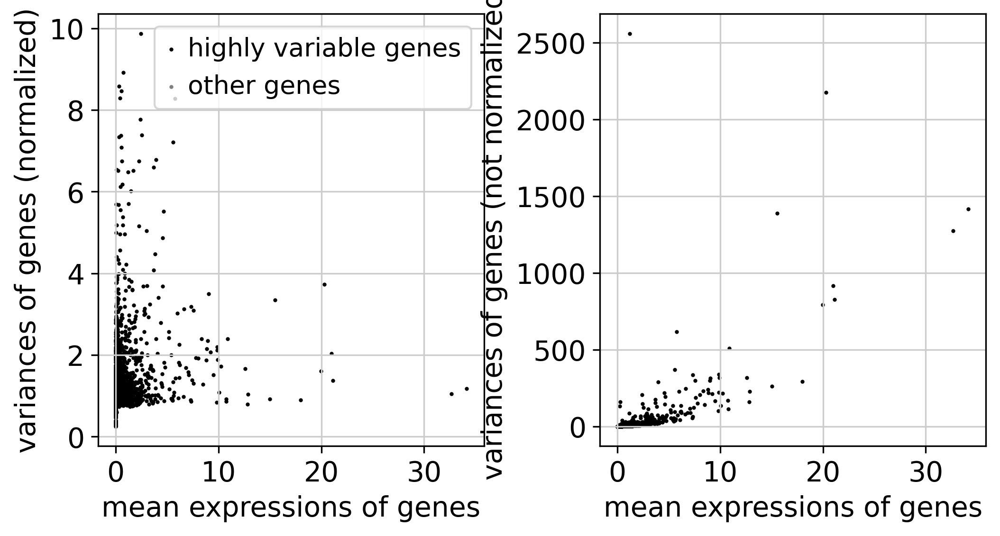

In [46]:
## Highly variable genes (per sample, then taking those appearing as HVGs in the most samples)
sc.pp.highly_variable_genes(
    adata_cells_r,
    n_top_genes=7000,
    subset=True,
    layer="counts",
    flavor="seurat_v3",
    batch_key="study",
    span=1,
)

sc.pl.highly_variable_genes(adata_cells_r)

In [47]:
cell_HVGs = adata_cells_r.var_names
nuc_HVGs = adata_nucs_r.var_names

union_hvgs = np.union1d(cell_HVGs, nuc_HVGs)

In [48]:
len(union_hvgs)

9720

In [49]:
pd.DataFrame(cell_HVGs).to_csv((output_p + 'cells_7K_HVGs.txt'), header=False, index=False)
pd.DataFrame(nuc_HVGs).to_csv((output_p + 'nucs_7K_HVGs.txt'), header=False, index=False)
pd.DataFrame(union_hvgs).to_csv((output_p + 'cell_nucs_union_HVGs.txt'), header=False, index=False)

In [50]:
## Subset for the union of HVGs
adata_r = adata_r[:, union_hvgs]

In [51]:
adata_r

View of AnnData object with n_obs × n_vars = 58658 × 9720
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'

In [52]:
adata_r.write_h5ad((output_p + 'adata_input_ec_HVGunion.h5ad'))

### 2. scVI

In [53]:
#adata_r = sc.read((output_p + '/adata_input_HVGunion.h5ad'))

In [54]:
adata_r = adata_r.copy()

In [55]:
## Set up scVI
scvi.model.SCVI.setup_anndata(adata_r,
                              layer="counts",
                              batch_key="donor", 
                              categorical_covariate_keys=[
                                                          'kit',
                                                          'study',
                                                          'cells_or_nuclei'
                                                          ],
                              continuous_covariate_keys = ['n_genes_by_counts',
                                                           'pct_counts_mt',
                                                           'pct_counts_rb']
                             )

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/opt/conda/envs/scvi/lib/python3.8/site-packages/scvi/data/_utils.py:168: UserWarning: Category 107 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  warnings.warn(


In [56]:
vae = scvi.model.SCVI(adata_r,
                      n_layers=1,
                      gene_likelihood="zinb",
                      dispersion='gene-batch')
vae.view_anndata_setup()

Anndata setup with scvi-tools version 0.17.1.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'counts',
│   'batch_key': 'donor',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': ['kit', 'study', 'cells_or_nuclei'],
│   'continuous_covariate_keys': ['n_genes_by_counts', 'pct_counts_mt', 'pct_counts_rb']
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│          n_vars          │ 9720  │
│         n_cells          │ 58658 │
│         n_batch          │  315  │
│         n_labels         │   1   │
│ n_extra_categorical_covs │   3   │
│ n_extra_continuous_covs  │   3   │
└──────────────────────────┴───────┘

                             Data Registry                             
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Registry Key      ┃            scvi-tools Location             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X            │           adata.layers['counts']           │
│         batch          │          adata.obs['_scvi_batch']          │
│         labels         │         adata.obs['_scvi_labels']          │
│ extra_categorical_covs │ adata.obsm['_scvi_extra_categorical_covs'] │
│ extra_continuous_covs  │ adata.obsm['_scvi_extra_continuous_covs']  │
└────────────────────────┴────────────────────────────────────────────┘

                   batch State Registry                    
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃  Categories  ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['donor'] │    18-142    │          0          │
│                    │    18-162    │          1          │
│                    │    18-312    │          2          │
│                    │     3499     │          3          │
│                    │     3504     │          4          │
│                    │     3535     │          5          │
│                    │     3593     │          6          │
│                    │     3613     │          7          │
│                    │     A23      │          8          │
│                    │     A24      │          9          │
│                    │     A25      │         10          │
│                    │     A26      │         11          │
│                    │     A29      │         12          │
│                    │     A32      │         13          │
│                    │     A33      │         14          │
│                    │     A34      │         15          │
│                    │     A35      │         16          │
│                    │     A37      │         17          │
│                    │     A40      │         18          │
│                    │     A41      │         19          │
│                    │     A42      │         20          │
│                    │     A43      │         21          │
│                    │     A44      │         22          │
│                    │     A45      │         23          │
│                    │     A46      │         24          │
│                    │     A47      │         25          │
│                    │     A48      │         26          │
│                    │     A51      │         27          │
│                    │   AFES365    │         28          │
│                    │   AFES448    │         29          │
│                    │      C1      │         30          │
│                    │      C2      │         31          │
│                    │      C3      │         32          │
│                    │      C4      │         33          │
│                    │      C5      │         34          │
│                    │      C7      │         35          │
│                    │      C8      │         36          │
│                    │      C9      │         37          │
│                    │     C41      │         38          │
│                    │     C58      │         39          │
│                    │     C70      │         40          │
│                    │     C72      │         41          │
│                    │    CTRL12    │         42          │
│                    │   CTRL085    │         43          │
│                    │   CTRL086    │         44          │
│                    │  CTRL099_21  │         45          │
│                    │  CTRL099_22  │         46          │
│                    │      D1      │         47          │
│                    │      D2      │         48          │
│                    │      D3      │         49          │
│                    │      D4      │         50          │
│                    │      D5      │         51          │
│                    │      D6      │         52          │
│                    │      D7      │         53          │
│                    │     D11      │         54          │
│                    │     E181     │         55          │
│                    │     E212     │         56          │
│                    │     E213     │         57          │
│                    │     E219     │         58          │
│                    │     E232     │         59          │
│                    │     E268     │         60          │
│                    │     E290     │         61          │
│                    │     E311     │   

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

                     extra_categorical_covs State Registry                     
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃       Source Location        ┃       Categories       ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│       adata.obs['kit']       │          10X           │          0          │
│                              │      10x3prime_v2      │          1          │
│                              │      10x3prime_v3      │          2          │
│                              │       10x5prime        │          3          │
│                              │       10x 3' v2        │          4          │
│                              │       10x 3' v3        │          5          │
│                              │       10x 5' v1        │          6          │
│                              │                        │                     │
│      adata.obs['study']      │   Garcia_et_al_2022    │          0          │
│                              │    Lake et al. 2021    │          1          │
│                              │ Litvinukova_et_al_2020 │          2          │
│                              │ MacParland_et_al_2018  │          3          │
│                              │  Madissoon_et_al_2022  │          4          │
│                              │    Muto et al. 2021    │          5          │
│                              │   Perez et al. 2022    │          6          │
│                              │     Sun_et_al_2023     │          7          │
│                              │           TS           │          8          │
│                              │   Tosti et al. 2021    │          9          │
│                              │   Winkler_et_al_2022   │         10          │
│                              │    Yang_et_al_2022     │         11          │
│                              │          hca           │         12          │
│                              │         liver          │         13          │
│                              │                        │                     │
│ adata.obs['cells_or_nuclei'] │         cells          │          0          │
│                              │         nuclei         │          1          │
│                              │                        │                     │
└──────────────────────────────┴────────────────────────┴─────────────────────┘

   extra_continuous_covs State    
             Registry             
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Source Location         ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['n_genes_by_counts'] │
│   adata.obs['pct_counts_mt']   │
│   adata.obs['pct_counts_rb']   │
└────────────────────────────────┘

In [57]:
## Train 
vae.train(max_epochs=400,batch_size=2000)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 400/400: 100%|██████████| 400/400 [47:08<00:00,  7.07s/it, loss=2.63e+03, v_num=1]


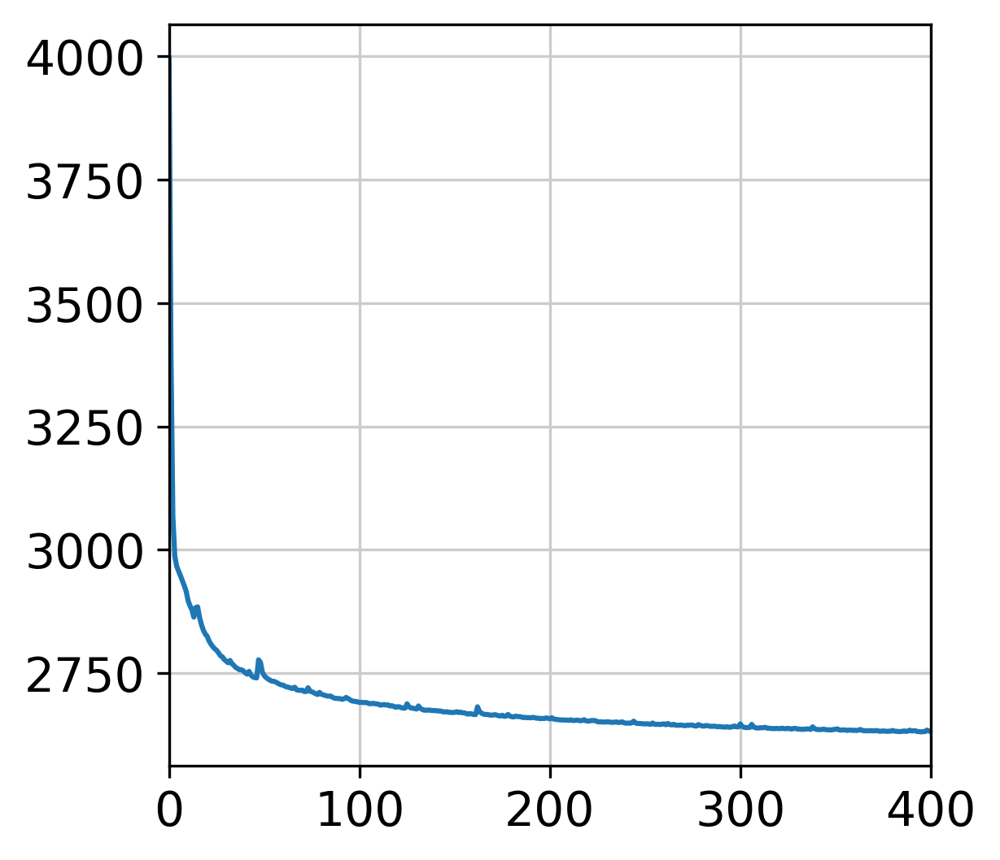

In [58]:
## Plot training history
plt.plot(vae.history['elbo_train'][:]);
plt.xlim(0, len(vae.history['elbo_train']));

In [59]:
#plt.plot(vae.history['reconstruction_loss_train']['reconstruction_loss_train'], label='train');
#plt.plot(vae.history['reconstruction_loss_validation']['reconstruction_loss_validation'], label='validation');
#plt.legend()

In [60]:
## Save model
vae.save(output_p + 'scVI_model_ec', overwrite = True)

In [61]:
## And save latent dimensions
np.save((output_p + "scVI_model_ec_X.npy"), vae.get_latent_representation())

### 3. Clustering and UMAP

In [62]:
adata_r.obsm["X_scVI"] = vae.get_latent_representation()
adata_r.X.shape
sc.pp.neighbors(adata_r, use_rep="X_scVI")

/opt/conda/envs/scvi/lib/python3.8/site-packages/pynndescent/pynndescent_.py:346: NumbaPendingDeprecationWarning: Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numba-captured-errors
Exception origin:
  File "/opt/conda/envs/scvi/lib/python3.8/site-packages/numba/core/types/functions.py", line 486, in __getnewargs__
    raise ReferenceError("underlying object has vanished")

  init_rp_tree(data, dist, current_graph, leaf_array)
/opt/conda/envs/scvi/lib/python3.8/site-packages/pynndescent/pynndescent_.py:348: NumbaPendingDeprecationWarning: Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#de

In [63]:
sc.tl.umap(adata_r)

In [64]:
adata_r

AnnData object with n_obs × n_vars = 58658 × 9720
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


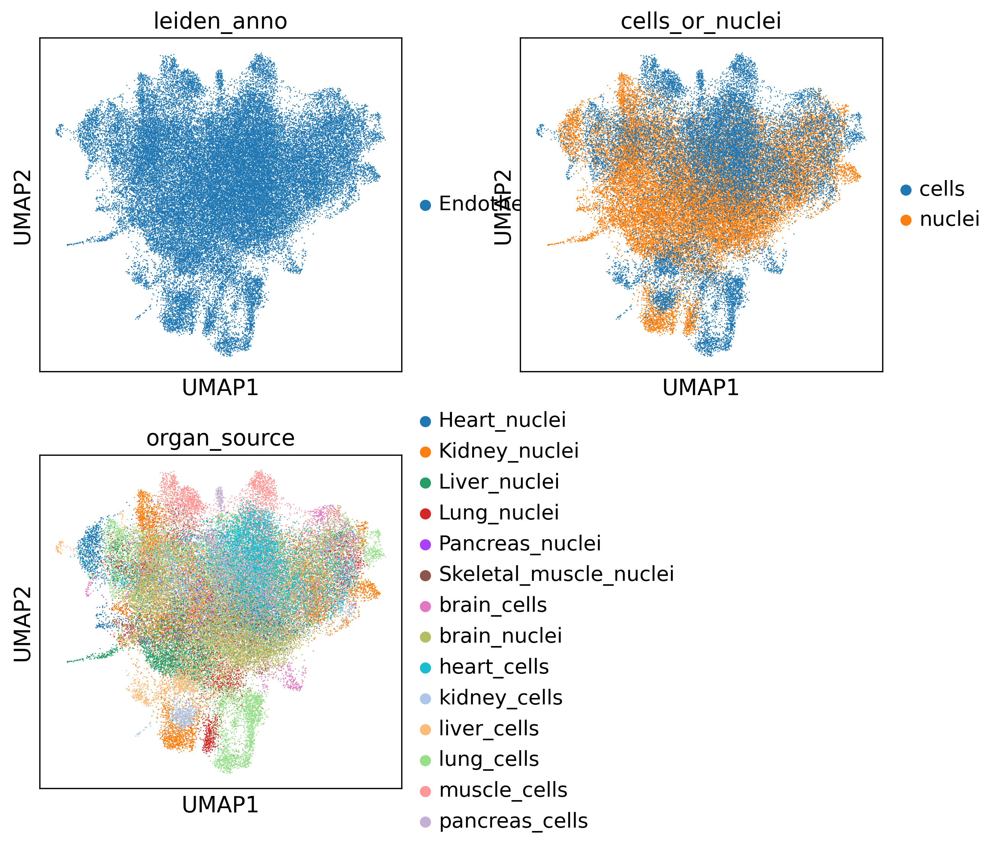

In [65]:
sc.pl.umap(adata_r, color = ['leiden_anno', 'cells_or_nuclei', 'organ_source'], ncols = 2)

/opt/conda/envs/scvi/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


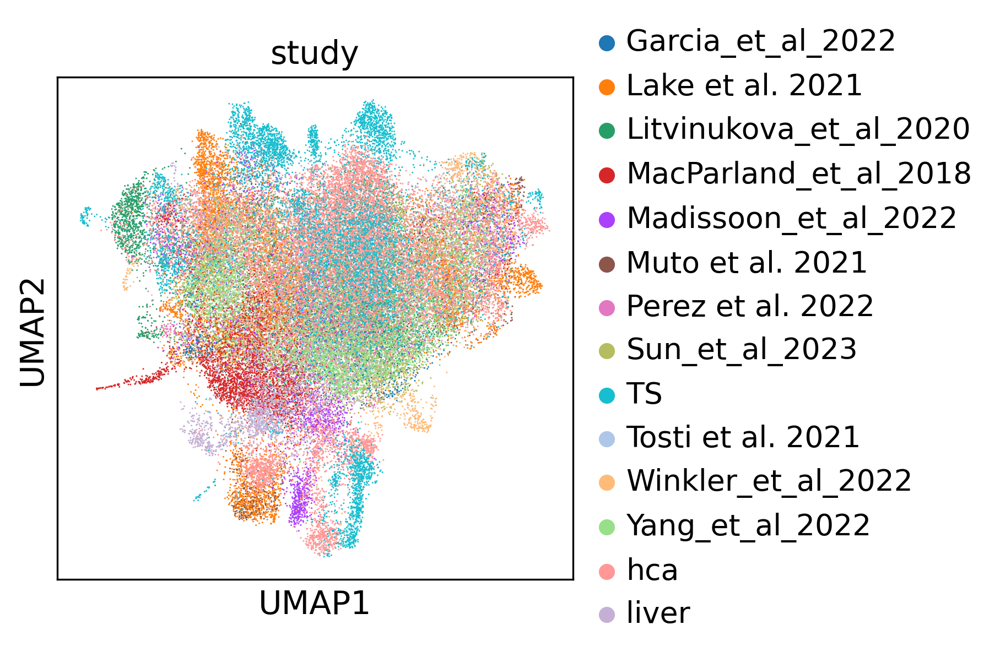

In [66]:
sc.pl.umap(adata_r, color=['study'])

In [67]:
adata_r

AnnData object with n_obs × n_vars = 58658 × 9720
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden_anno_colors', 'cells_or_nuclei_colors', 'organ_source_colors', 'study_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [68]:
full_scvi = adata_r
full_scvi

AnnData object with n_obs × n_vars = 58658 × 9720
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden_anno_colors', 'cells_or_nuclei_colors', 'organ_source_colors', 'study_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [69]:
full = sc.read_h5ad(output_p + 'ec_cell_nuc_before_scvi_240719.h5ad')
full

AnnData object with n_obs × n_vars = 58658 × 14580
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'

In [70]:
full.uns = full_scvi.uns
full.obsm = full_scvi.obsm
full.obsp = full_scvi.obsp
full.obs = full_scvi.obs

In [71]:
full

AnnData object with n_obs × n_vars = 58658 × 14580
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden_anno_colors', 'cells_or_nuclei_colors', 'organ_source_colors', 'study_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [72]:
full.write(output_p + "ec_cell_nuc_scvi_240719.h5ad", compression = 'gzip')

In [73]:
full

AnnData object with n_obs × n_vars = 58658 × 14580
    obs: 'donor', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'kit', 'study', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden_1', 'leiden_0.5', 'leiden_0.1', 'batch_scarches', 'cells_or_nuclei', 'organ_source', 'leiden_anno'
    uns: '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden_anno_colors', 'cells_or_nuclei_colors', 'organ_source_colors', 'study_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'